In [1]:
# import modules
import numpy as np
import pandas as pd
import sklearn
import matplotlib.patches as mpatches
from matplotlib import pyplot as plt
from PIL import Image

plt.rcParams["figure.figsize"] = (20,10)

In [2]:
def letter_converter(letter):
    try:
        result = 0
        letters = {"F": 0, "E": 1, "D": 2, "C": 3, "B": 4, "A": 5, "+": 0.3, "-": -0.3}
        for s in letter:
            result += letters[s]
        return result
    except:
        # print("Error parsing " + letter)
        return 0
        
def price_converter(price):
    try:
        price = price.replace(",", "")
        return int(price)
    except:
        # print("Error parsing " + price)
        return 0

In [25]:
df = pd.read_csv("../data/AB_NYC_2019_updated.csv", converters={
    "amenities": letter_converter,
    "cost_of_living": letter_converter,
    "crime": letter_converter,
    "employment": letter_converter,
    "housing": letter_converter,
    "school": letter_converter,
    "weather": letter_converter,
    "home_median": price_converter,
    "rent_median": price_converter
})

room_df = pd.get_dummies(df['room_type'])
df = pd.concat([df, room_df], axis=1).drop("room_type", axis=1)
print(df.iloc[:10])
print(df.columns)

   Unnamed: 0      id                                   name  host_id  \
0           0    2539     Clean & quiet apt home by the park     2787   
1           1    2539     Clean & quiet apt home by the park     2787   
2           2   63546         Large and Cozy Private Bedroom   308652   
3           3   63546         Large and Cozy Private Bedroom   308652   
4           4  125594     SUPER BIG AND COZY PRIVATE BEDROOM   308652   
5           5  125594     SUPER BIG AND COZY PRIVATE BEDROOM   308652   
6           6  267652  Private clean pleasant spacious room.   164675   
7           7  267652  Private clean pleasant spacious room.   164675   
8           8  282341    Kensington/Ditmas Park pied-a-terre  1471384   
9           9  282341    Kensington/Ditmas Park pied-a-terre  1471384   

  host_name neighbourhood_group neighbourhood  latitude  longitude  price  \
0      John            Brooklyn    Kensington  40.64749  -73.97237    149   
1      John            Brooklyn    Kensing

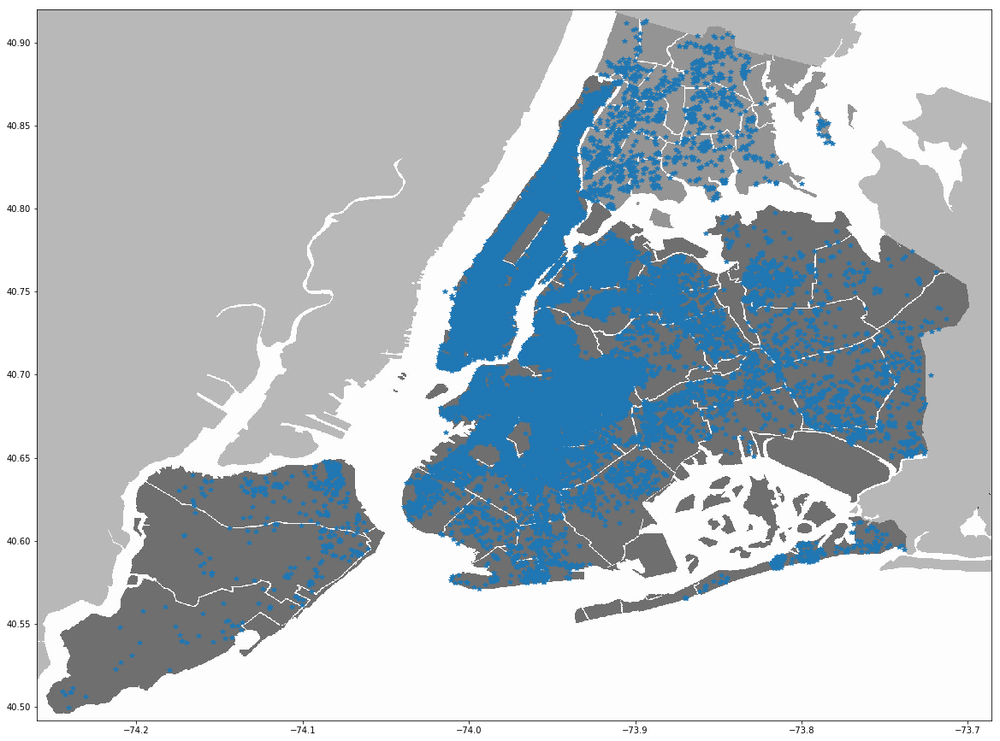

In [7]:
latitude_range = (40.492, 40.92)
longitude_range = (-74.26, -73.686)

plt.rcParams["figure.figsize"] = (20,20)

ny_map = np.array(Image.open('../data/New_York_City_.png'))
plt.imshow(ny_map, extent=longitude_range+latitude_range)
positions = np.array(df[['longitude', 'latitude']])
plt.plot(positions[:, 0], positions[:, 1], '*')

k=1, bic=703448.168868
k=2, bic=613384.927439
k=3, bic=600283.630614
k=4, bic=594100.150629
k=5, bic=592195.212563
k=6, bic=592029.621416
k=7, bic=592338.145613
k=8, bic=592031.032456
k=9, bic=590793.771525


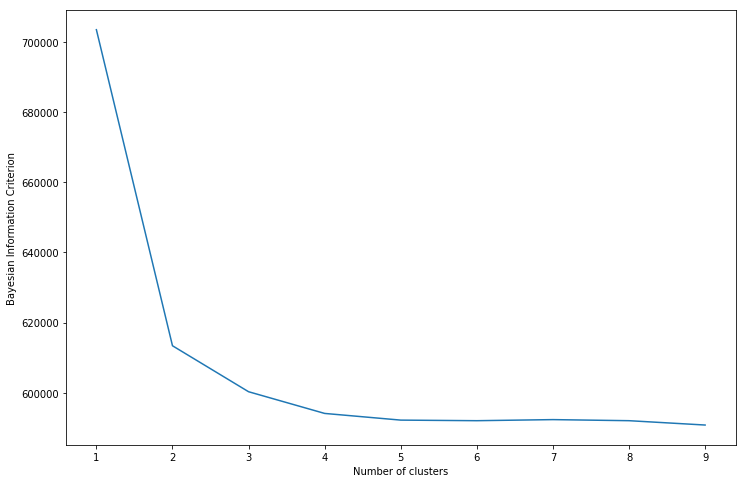

In [15]:
# GMM price
from sklearn.mixture import GaussianMixture

X = df[['price']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
bics = []
for k in range(1, 10):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    bics.append(bic)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k

plt.rcParams["figure.figsize"] = (12,8)
plt.plot(range(1, 10), bics)
plt.xlabel("Number of clusters")
plt.ylabel("Bayesian Information Criterion")
plt.show()

# k = best_k
# gmm = GaussianMixture(best_k)
# y = gmm.fit_predict(X)
# print("Weights: ", gmm.weights_)
# print("Means: ", gmm.means_)

In [16]:
k_price = 4
gmm = GaussianMixture(k_price)
y_price = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

Weights:  [0.56103968 0.00591314 0.36424386 0.06880331]
Means:  [[  80.00892414]
 [2136.74817892]
 [ 184.47060943]
 [ 433.09299661]]


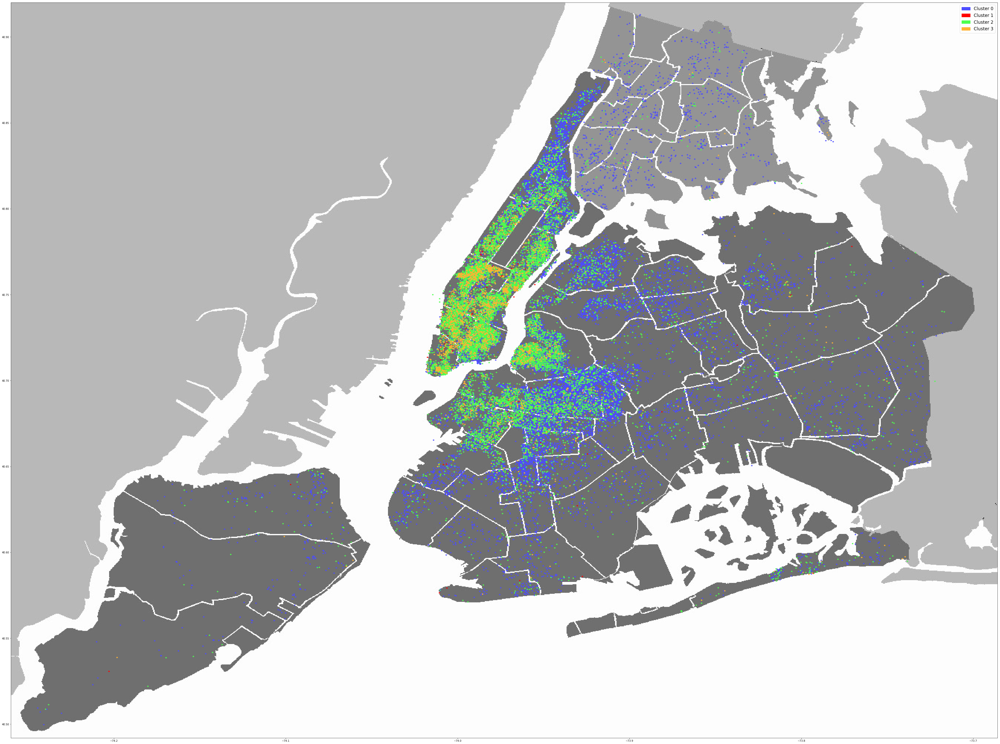

In [18]:
def plot_map(y, k, colors):
    plt.rcParams["figure.figsize"] = (70,70)
    plt.imshow(ny_map, extent=longitude_range+latitude_range)
    positions = np.array(df[['longitude', 'latitude']])
    handles = []
    for i in range(k):
        p = plt.plot(positions[:, 0][y==i], positions[:, 1][y==i], '*', color=colors[i])
        patch = mpatches.Patch(color=colors[i], label=('Cluster %d' % i)) 
        handles.append(patch)
    plt.legend(handles=handles, fontsize = 'xx-large')
    plt.show()
    
plot_map(y_price, 4, colors=((0.3, 0.3, 1), (1, 0, 0), (0.3, 1, 0.3),  (1, 0.7, 0.2)))

k=1, bic=704439.958875
k=2, bic=510590.721565
k=3, bic=386851.400277
k=4, bic=243000.503788
k=5, bic=236961.400939
k=6, bic=226099.399028
k=7, bic=225237.189969
k=8, bic=219253.275249
k=9, bic=218260.103720


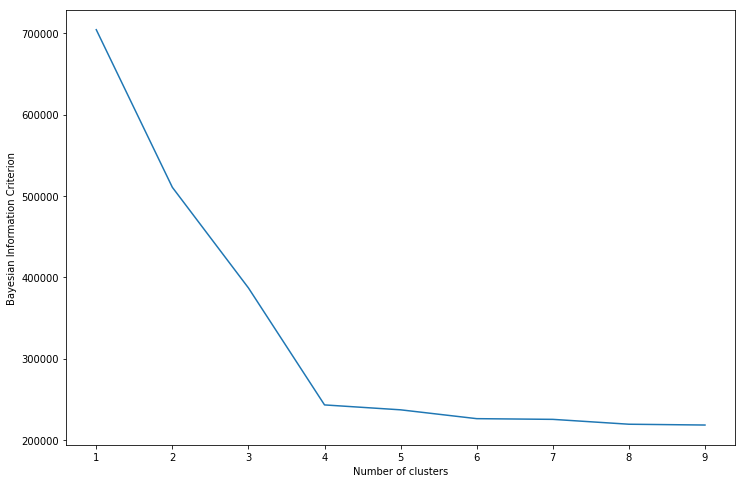

In [10]:
# GMM reviews
from sklearn.mixture import GaussianMixture

X = df[['number_of_reviews', 'reviews_per_month']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
bics = []
for k in range(1, 10):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    bics.append(bic)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k

plt.rcParams["figure.figsize"] = (12,8)
plt.plot(range(1, 10), bics)
plt.xlabel("Number of clusters")
plt.ylabel("Bayesian Information Criterion")
plt.show()

In [11]:
k_review = 4
gmm = GaussianMixture(k_review)
y_review = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

Weights:  [0.2600485  0.30326516 0.20602376 0.23066258]
Means:  [[ 3.50594193  0.13987712]
 [15.28710186  0.99921783]
 [ 0.          0.        ]
 [77.15323488  3.31218652]]


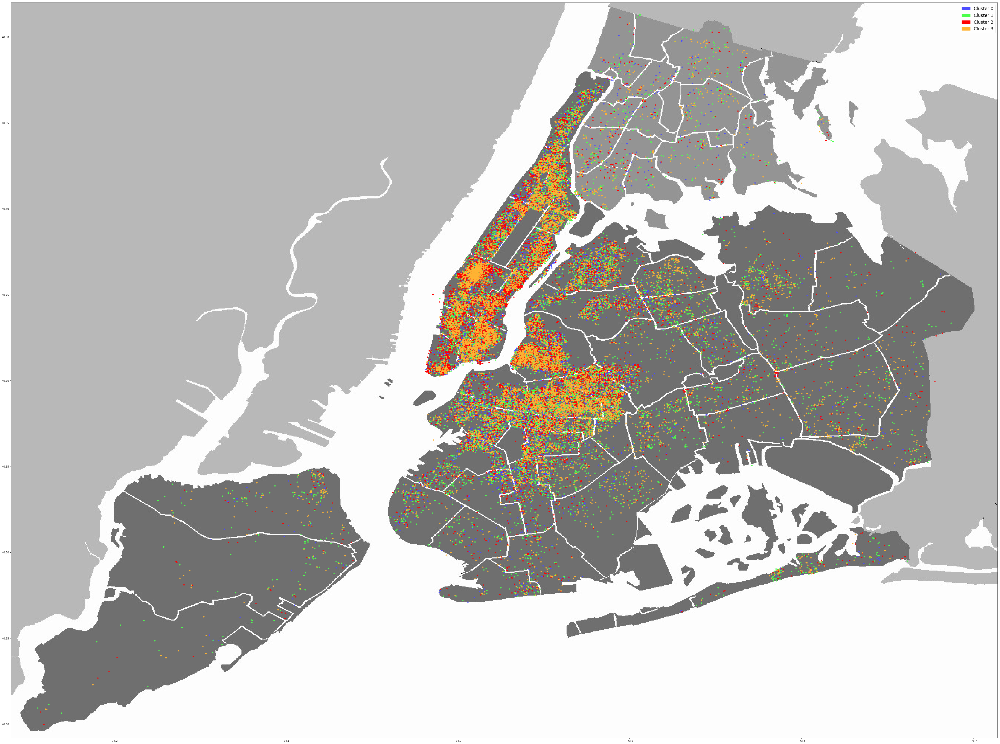

In [12]:
  plot_map(y_review, 4, colors=((0.3, 0.3, 1), (0.3, 1, 0.3), (1, 0, 0), (1, 0.7, 0.2)))

k=1, bic=643055.515009
k=2, bic=261270.493014
k=3, bic=249154.583997
k=4, bic=241695.106689
k=5, bic=240532.205285
k=6, bic=237071.529803
k=7, bic=229866.791775
k=8, bic=236425.944541
k=9, bic=230056.370611


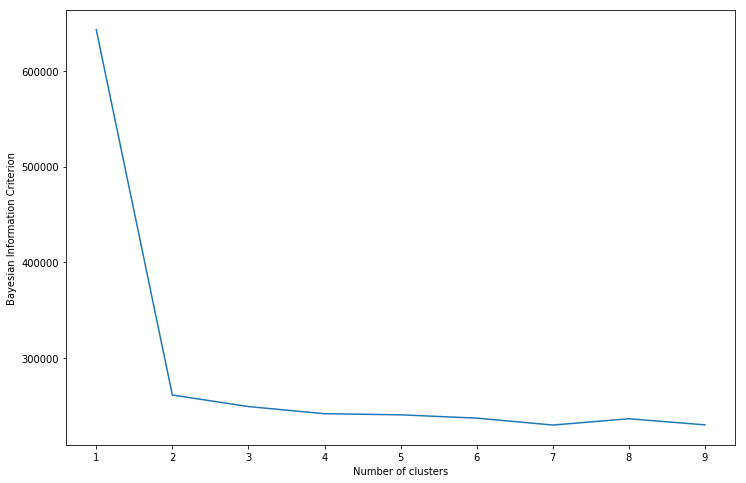

In [36]:
# GMM reviews
from sklearn.mixture import GaussianMixture

X = df[['availability_365']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
bics = []
for k in range(1, 10):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    bics.append(bic)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k

plt.rcParams["figure.figsize"] = (12,8)
plt.plot(range(1, 10), bics)
plt.xlabel("Number of clusters")
plt.ylabel("Bayesian Information Criterion")
plt.show()

In [37]:
k_avail = 2
gmm = GaussianMixture(k_avail)
y_avail = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

Weights:  [0.35505804 0.64494196]
Means:  [[  0.       ]
 [176.2679631]]


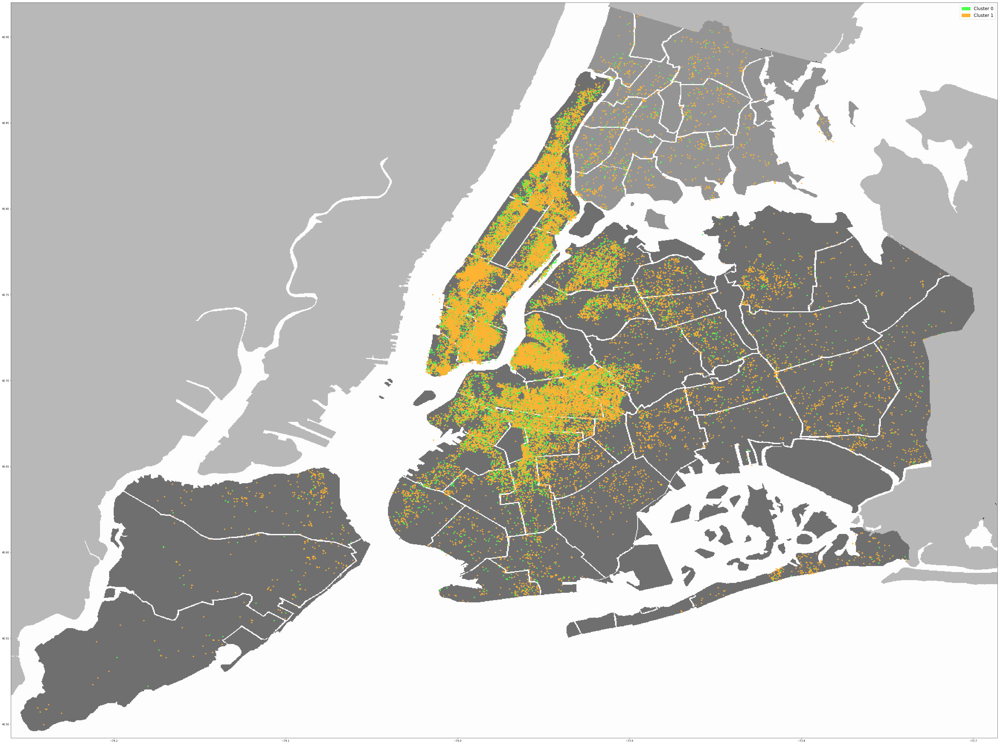

In [40]:
plot_map(y_price, 2, colors=((0.3, 1, 0.3), (1, 0.7, 0.2), (0.3, 0.3, 1), (1, 0, 0)))

In [33]:
y_room = np.zeros([y_price.shape[0], 1])
for i in range(len(y_price)):
    if df.loc[i, 'Private room'] == 1:
        y_room[i][0] = 1
    if df.loc[i, 'Shared room'] == 1:
        y_room[i][0] = 2
        
print(y_room)

#'Entire home/apt', 'Private room', 'Shared room'

[[1.]
 [1.]
 [1.]
 ...
 [1.]
 [1.]
 [0.]]


In [34]:
k_room = 3
gmm = GaussianMixture(k_room)
y_room = gmm.fit_predict(y_room)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

Weights:  [0.52263463 0.45261425 0.02475112]
Means:  [[0.]
 [1.]
 [2.]]


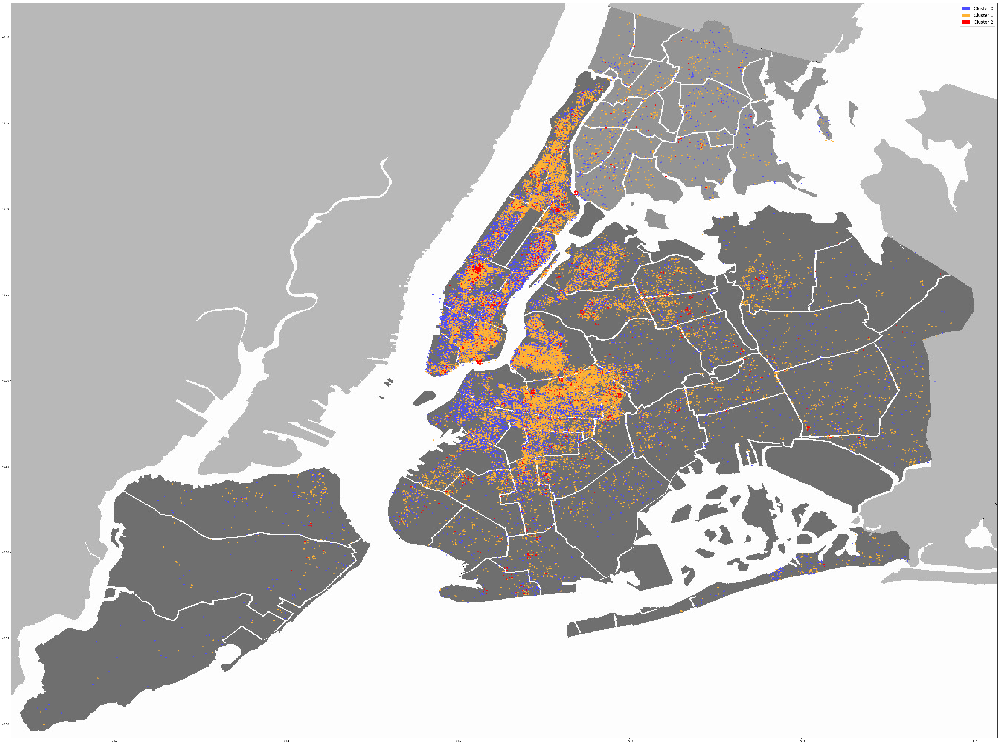

In [35]:
plot_map(y_room, 3, colors=((0.3, 0.3, 1), (1, 0.7, 0.2), (1, 0, 0), (0.3, 1, 0.3)))